# Задание, которое в форме для ДЗ - применить алгоритмы извлечения признаков.


---

Полученные замечания:
- оператор Собеля лучше применять к изображению в gray-scale, как и Кэнни;

- для большей чистоты кода следует использовать функции вместо дублирования copy-paste одного и тот же фрагмента кода к разным входным данным (например, представьте, если было бы не три, а 20 изображений) 

Установка пакета scikit-image.

In [5]:
%pip install -U scikit-image

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Импортируем необходимые библиотеки.

In [6]:
from matplotlib import pyplot as plt
import cv2 as cv 
from google.colab.patches import cv2_imshow

from skimage import data
from skimage.feature import corner_harris, corner_subpix, corner_peaks, hog
from skimage.feature import match_descriptors, plot_matches
from skimage.transform import warp, AffineTransform

from sklearn.cluster import DBSCAN

from skimage.draw import ellipse
from skimage import io, exposure
from skimage.color import rgb2gray

import numpy as np
import glob

Читаем изображения.

In [7]:
cv_rgb_img = [];
cv_gray_img = [];
for img in glob.glob("/content/*.JPG"):
    image = cv.imread(img);
    grayscale = cv.cvtColor(image,cv.COLOR_BGR2GRAY);
    cv_rgb_img.append(image);
    cv_gray_img.append(grayscale);

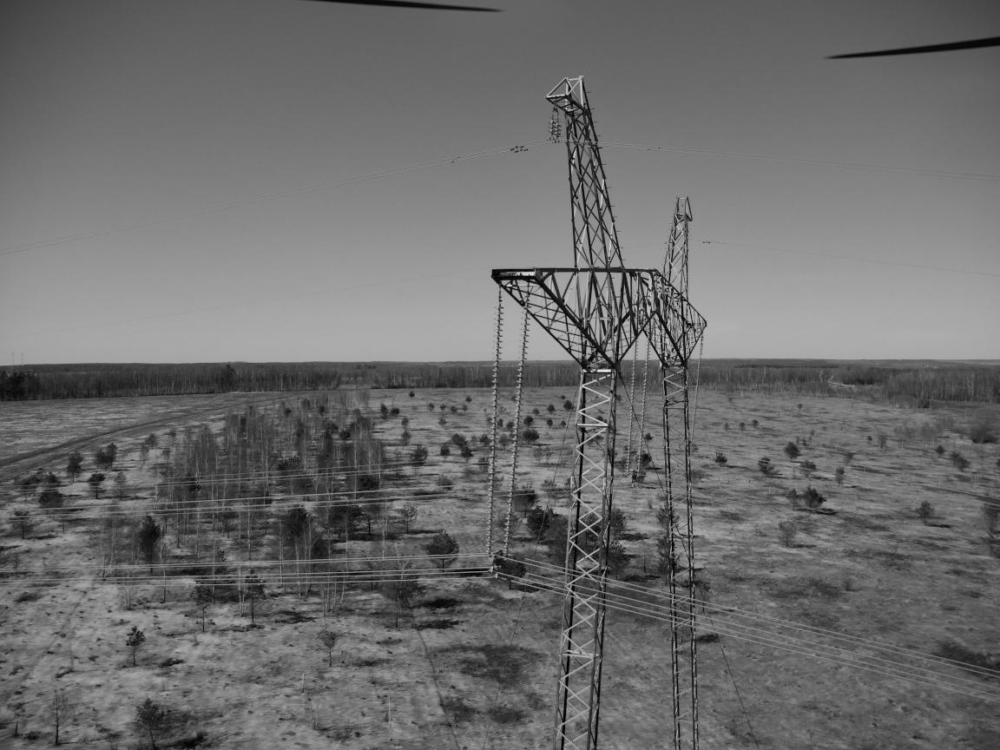

In [8]:
cv2_imshow(cv_gray_img[0])

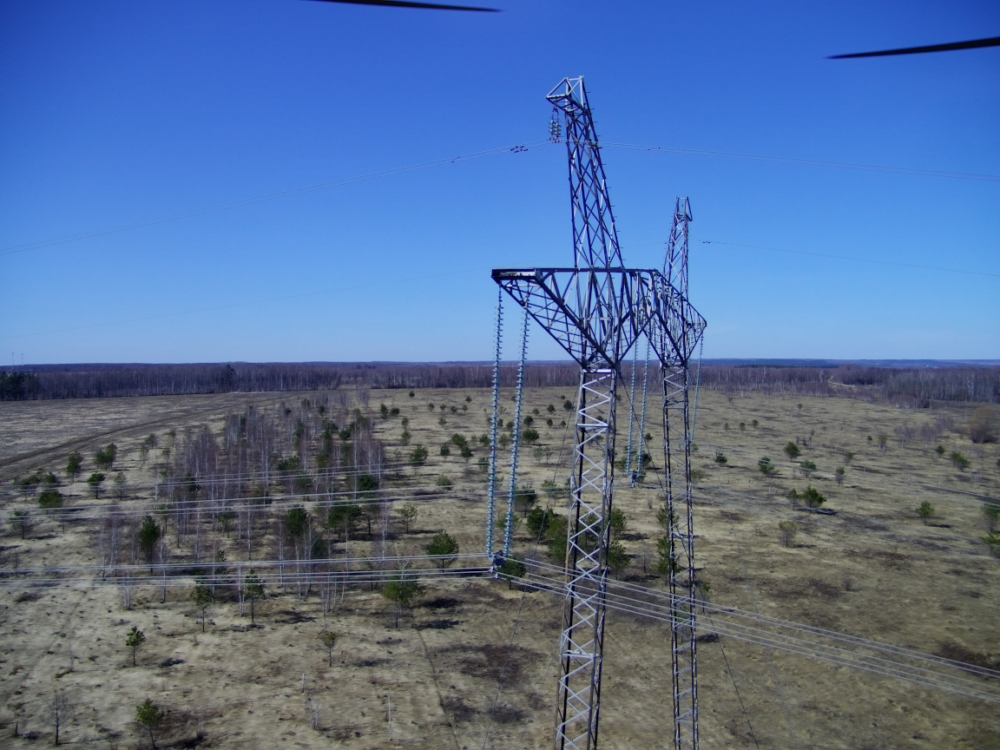

In [9]:
cv2_imshow(cv_rgb_img[0])

# Детектор углов Харриса 
----

Функция, описывающая Детектор углов Харриса.

In [10]:
def harris (image, distance, threshold):
  coords = corner_peaks(corner_harris(image), min_distance=distance, threshold_rel= threshold);
  fig, ax = plt.subplots(figsize=(20, 15));
  ax.imshow(image, cmap=plt.cm.gray);
  ax.plot(coords[:, 1], coords[:, 0], color='red', marker='+', linestyle='None', markersize=20);
  plt.show();

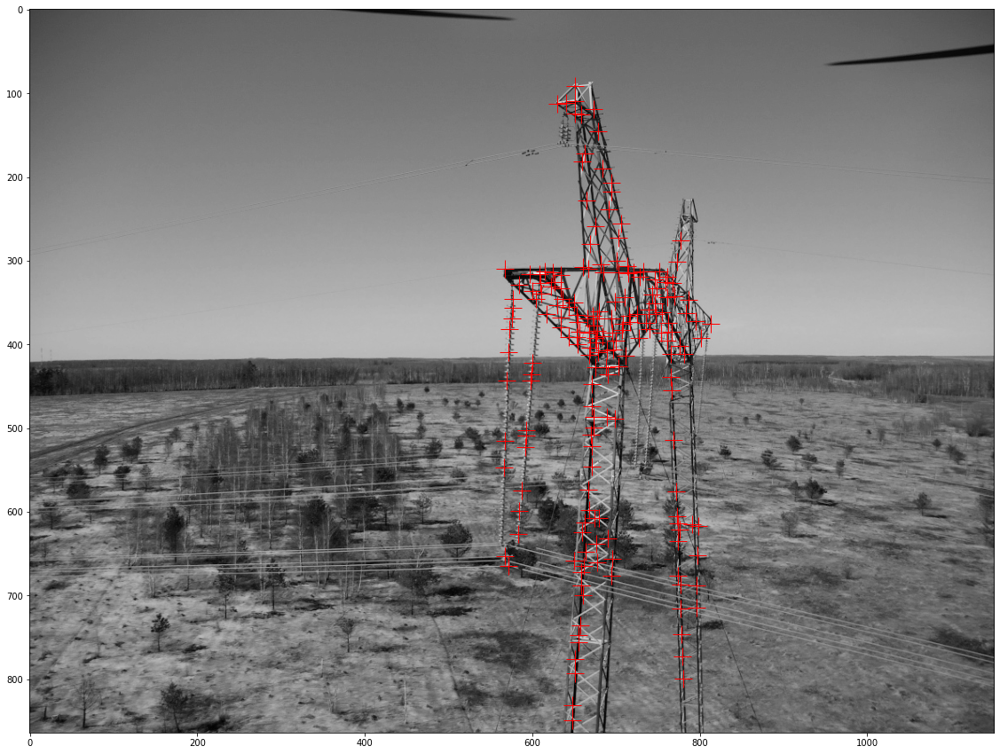

In [11]:
harris (cv_gray_img[0], 5, 0.1);

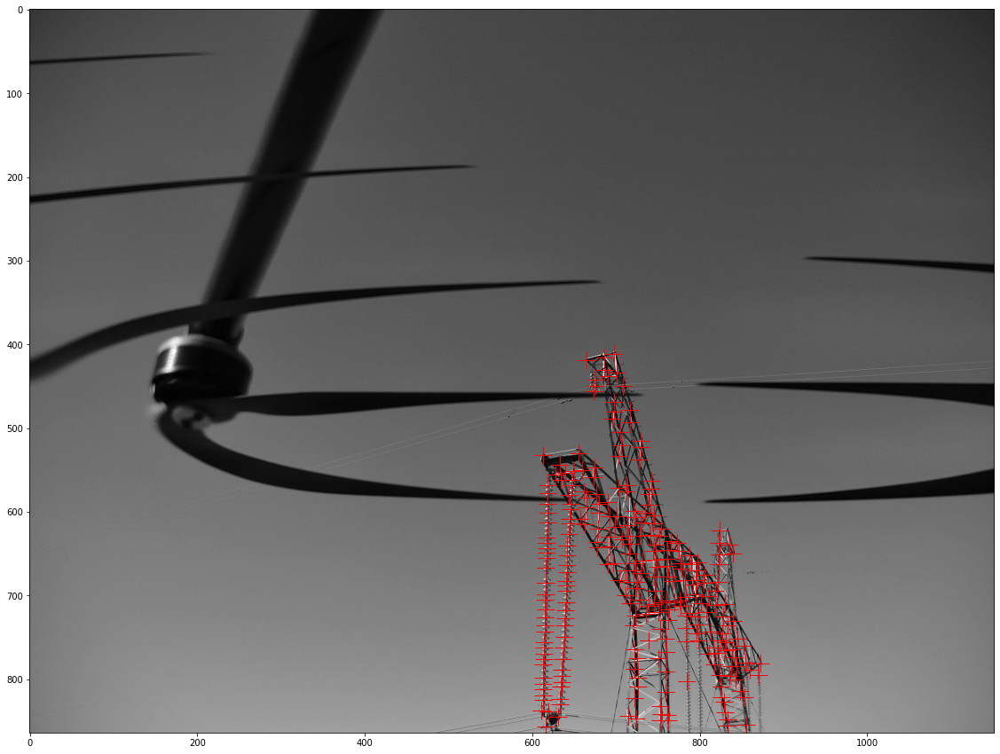

In [12]:
harris (cv_gray_img[1], 5, 0.03);

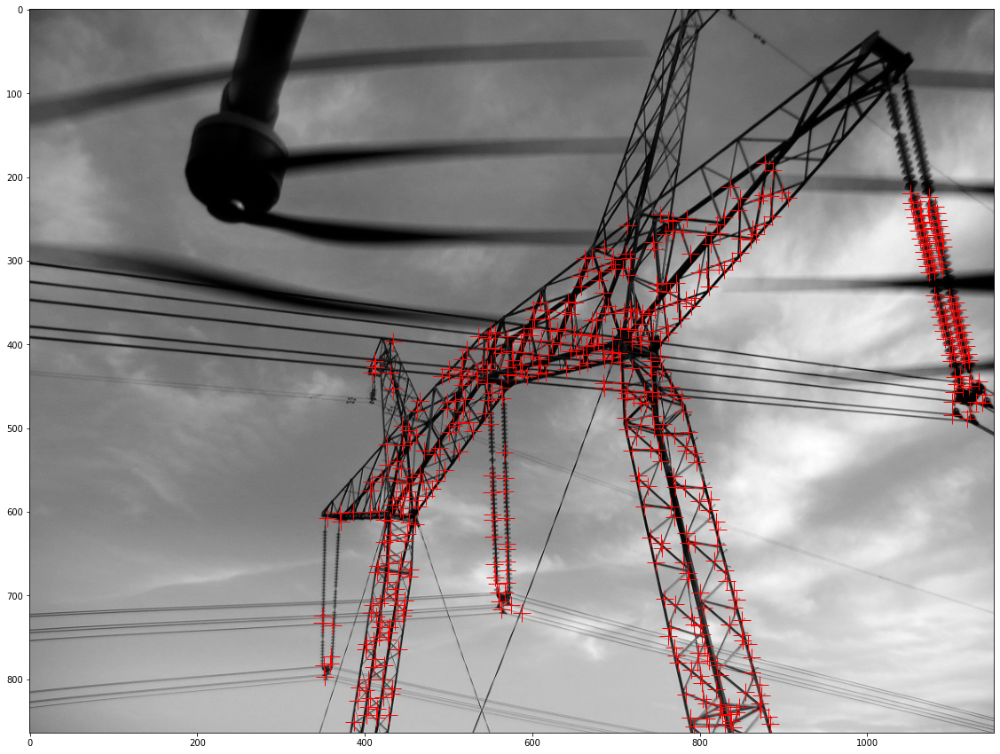

In [13]:
harris (cv_gray_img[2], 5, 0.05);

# Детектор границ Канни

---

Функция, описывающая Детектор Канни.

In [14]:
def canny (grayscale, low_threshold, high__threshold):
  canny_img = cv.Canny(grayscale, low_threshold, high__threshold, apertureSize=3);
  fig, ax = plt.subplots(figsize=(20, 15));
  ax.imshow(canny_img, cmap=plt.cm.gray);
  plt.show();

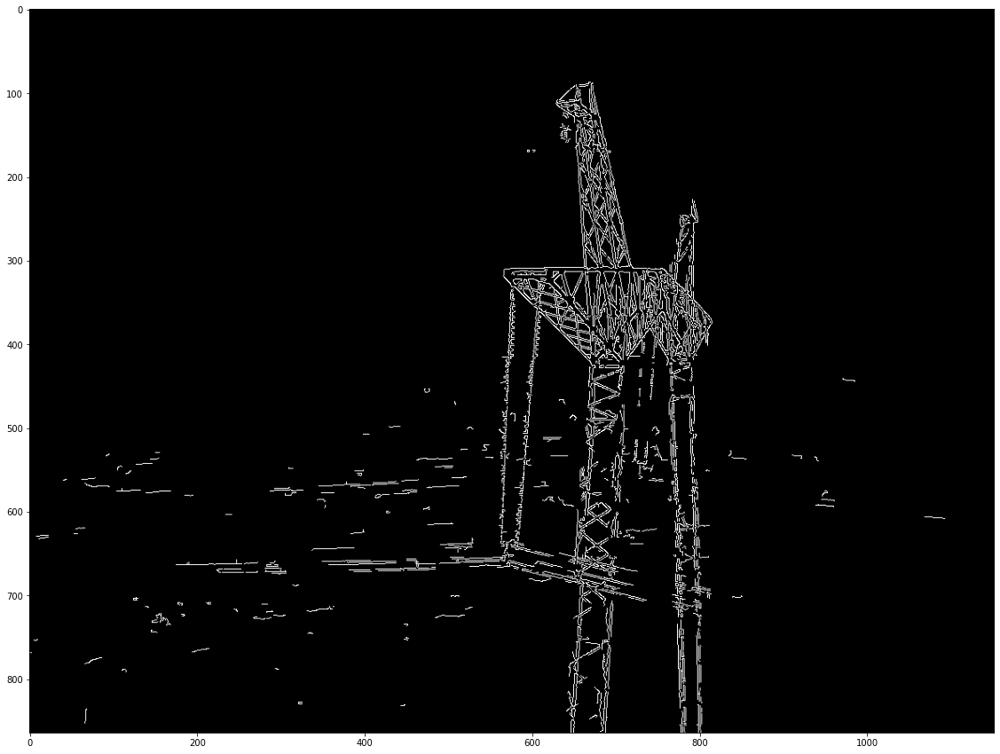

In [15]:
canny(cv_gray_img[0], 250, 450);

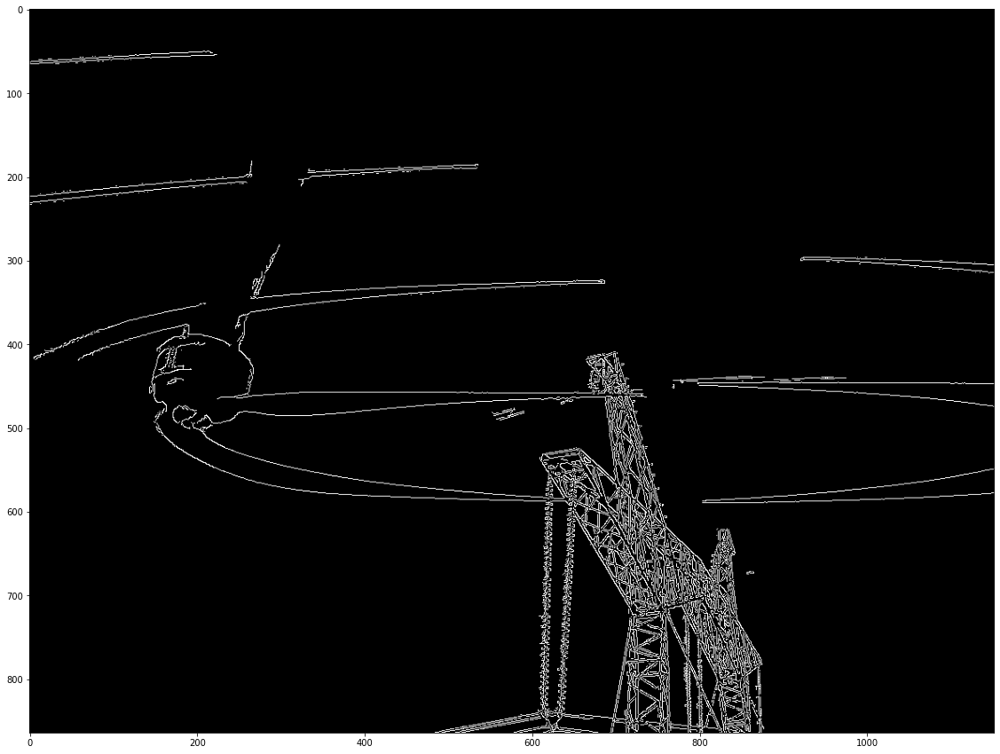

In [16]:
canny(cv_gray_img[1], 20, 120);

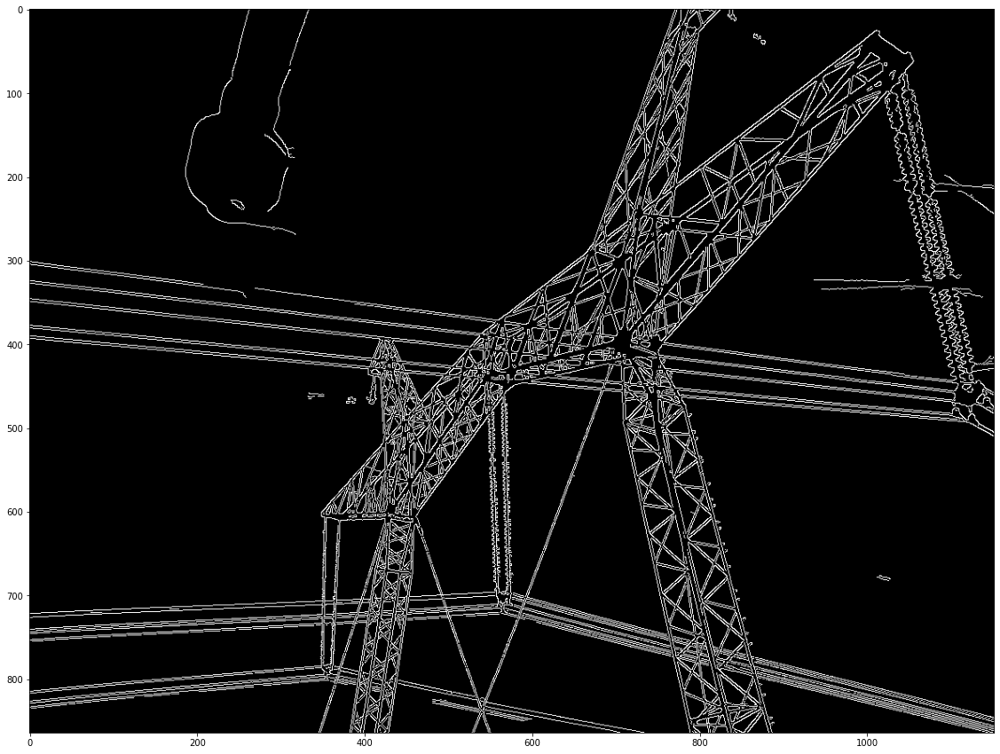

In [17]:
canny(cv_gray_img[2], 60, 150);

# Оператор Собеля

---

Функция, описывающая оператор Собеля.

In [18]:
def sobel (grayscale, ddepth, ksize, scale, delta, prior_x, prior_y):
  grad_x = cv.Sobel(grayscale, ddepth, 1, 0, ksize=ksize, scale=scale, delta=delta);
  grad_y = cv.Sobel(grayscale, ddepth, 0, 1, ksize=ksize, scale=scale, delta=delta);
  Scale_absX = cv.convertScaleAbs(grad_x);
  Scale_absY = cv.convertScaleAbs(grad_y);
  result = cv.addWeighted(Scale_absX, prior_x, Scale_absY, prior_y, 0);
  Hori_1 = np.concatenate((grayscale, grad_x), axis=1);
  Hori_2 = np.concatenate((grad_y, result), axis=1);
  cv2_imshow(Hori_1);
  cv2_imshow(Hori_2);

In [19]:
sobel (cv_gray_img[0], cv.CV_32F, 3, 1, 0, 0.1, 0.9);

Output hidden; open in https://colab.research.google.com to view.

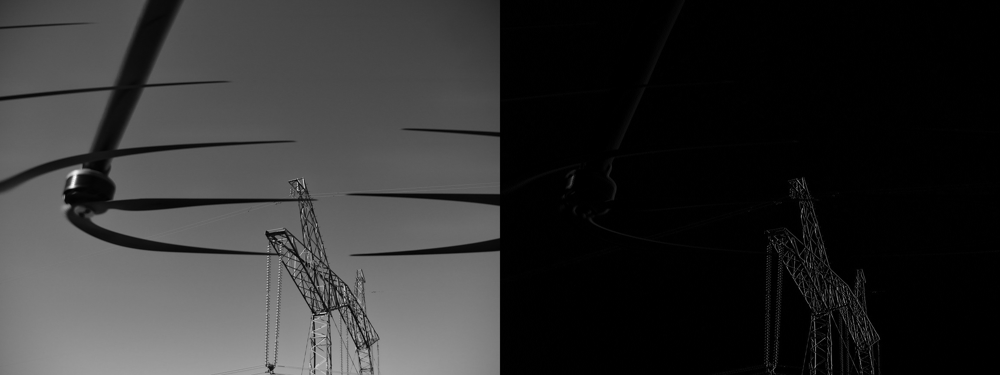

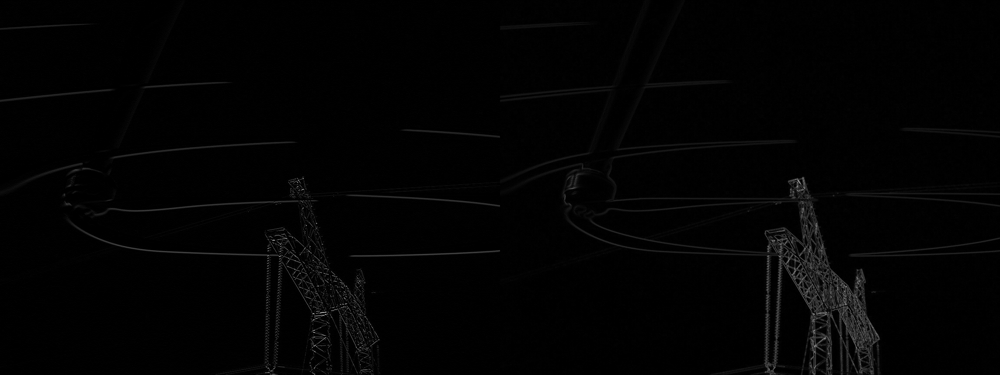

In [20]:
sobel (cv_gray_img[1], cv.CV_64F, 1, 1, 0, 0.5, 0.5);

In [21]:
sobel (cv_gray_img[2], cv.CV_64F, 1, 2, 0, 0.5, 0.5);

Output hidden; open in https://colab.research.google.com to view.

# Морфологические преобразования

---

Функция, описывающая Морфологические преобразования.

In [22]:
def morf (cv_rgb_img, cv_gray_img, low_HSV, high_HSV, kernel_1, kernel_2):
  image_filtered = cv.inRange(cv_rgb_img, np.array(low_HSV), np.array(high_HSV));
  eroded = cv.morphologyEx(image_filtered, cv.MORPH_ERODE, np.ones((kernel_1),np.uint8));
  dilated = cv.morphologyEx(eroded, cv.MORPH_DILATE, np.ones((kernel_2),np.uint8));
  fig, ax = plt.subplots(2, 2, figsize=(20, 20));
  ax[0, 0].imshow(image);
  ax[0, 1].imshow(cv.addWeighted(cv_gray_img, 0.5, image_filtered, 1., 0.));
  ax[1, 0].imshow(cv.addWeighted(cv_gray_img, 0.5, eroded, 1.0, 0.));
  ax[1, 1].imshow(cv.addWeighted(cv_gray_img, 0.5, dilated, 1.0, 0.));  

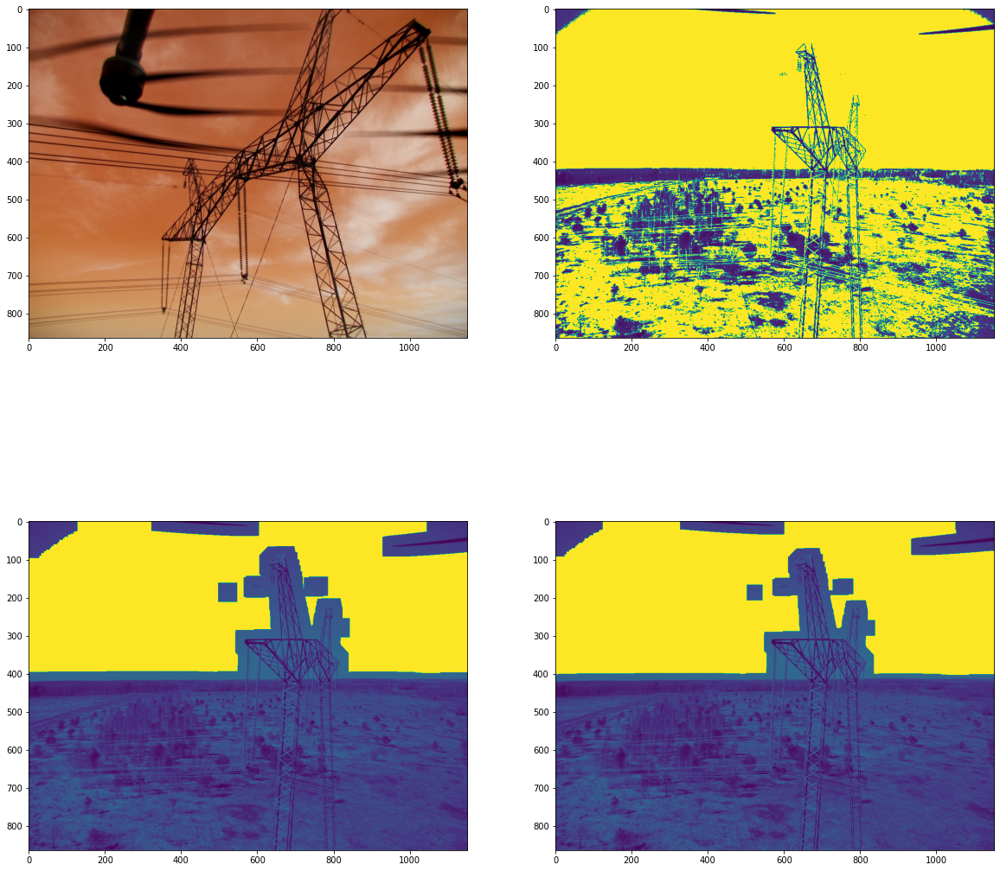

In [23]:
morf (cv_rgb_img[0], cv_gray_img[0], (80,80,1), (255,255,200), (50,50), (10,10))

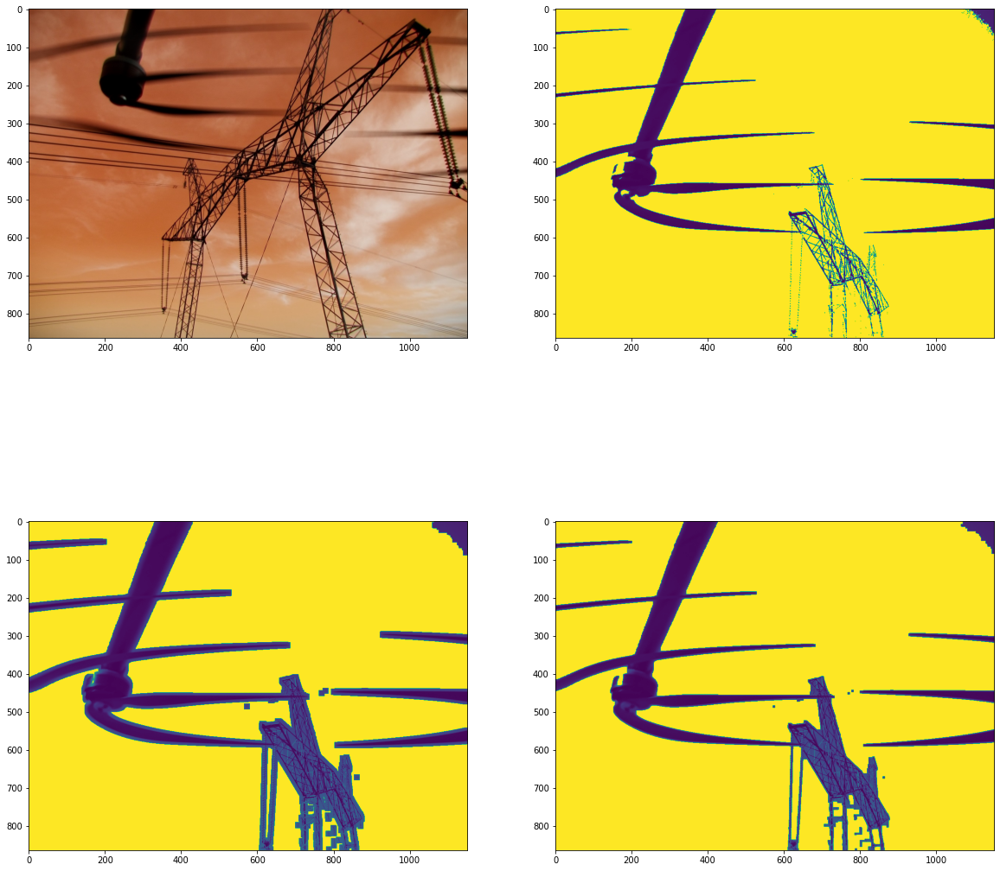

In [24]:
morf (cv_rgb_img[1], cv_gray_img[1], (50,50,1), (255,255,255), (15,15), (10,10))

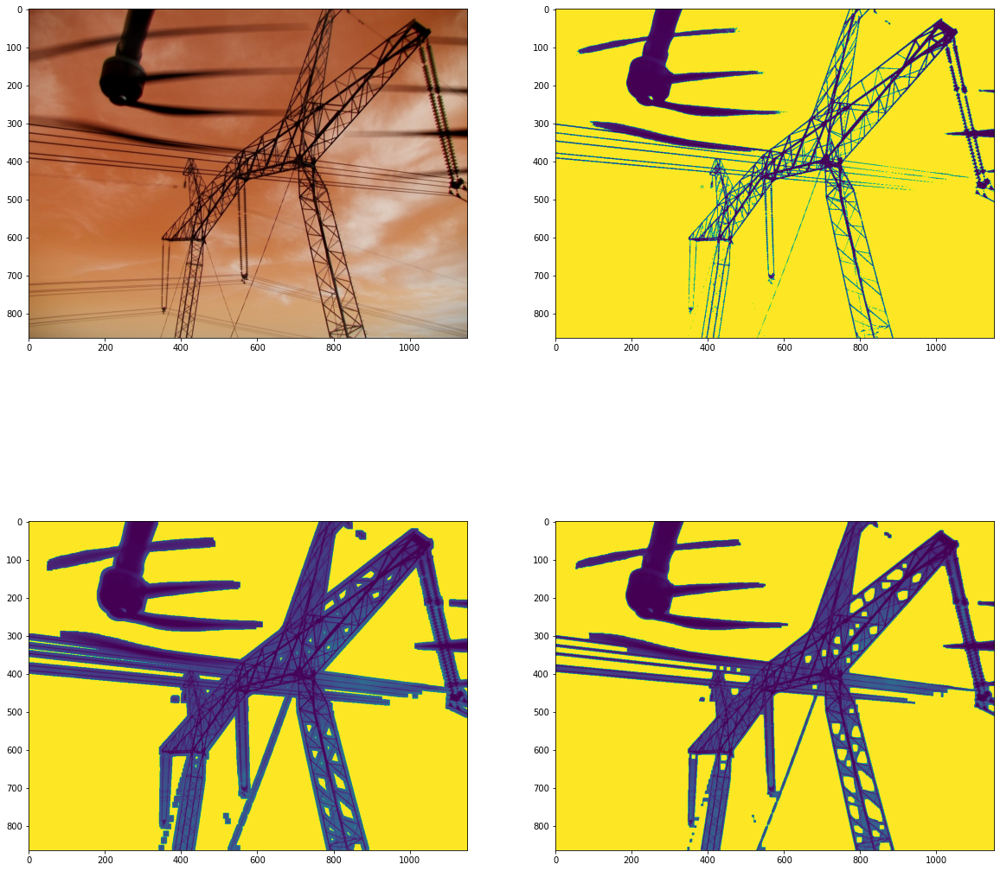

In [25]:
morf (cv_rgb_img[2], cv_gray_img[2], (50,50,1), (255,255,255), (15,15), (10,10))

# Гистограмма ориентированных градиентов
---

Функция, описывающая Гистограмму ориентированных градиентов.

In [26]:
def histogram (image, orientations, rescale_intensity_low, rescale_intensity_high):
  fd, hog_image = hog(image, orientations=orientations, pixels_per_cell=(5, 5),cells_per_block=(1, 1), visualize=True, channel_axis = -1);
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 80), sharex=True, sharey=True);
  ax1.axis('off');
  ax1.imshow(image);
  ax1.set_title('Input image');
  hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(rescale_intensity_low, rescale_intensity_high));
  ax2.axis('off');
  ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray);
  ax2.set_title('Histogram of Oriented Gradients');
  plt.show();

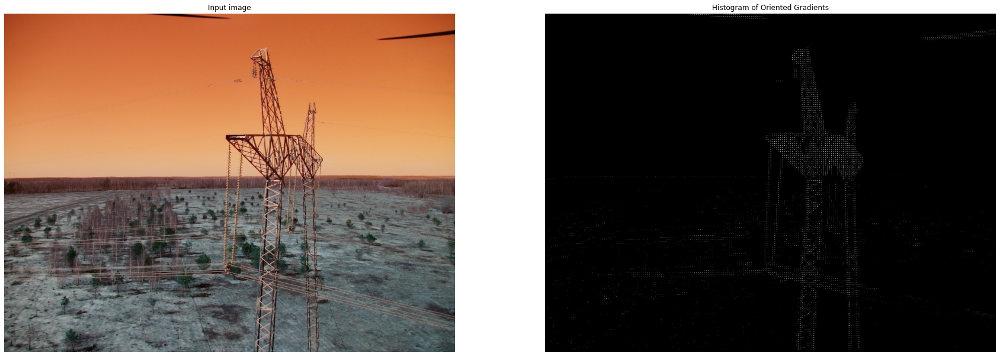

In [27]:
histogram(cv_rgb_img[0], 10, 20, 60)

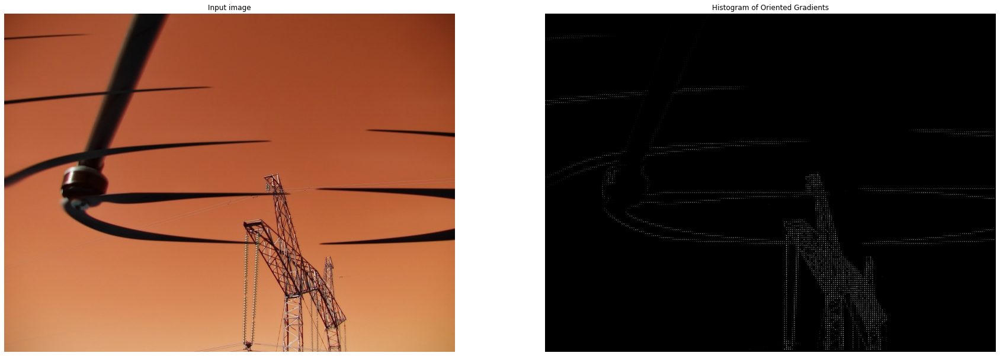

In [28]:
histogram(cv_rgb_img[1], 20, 15, 60)

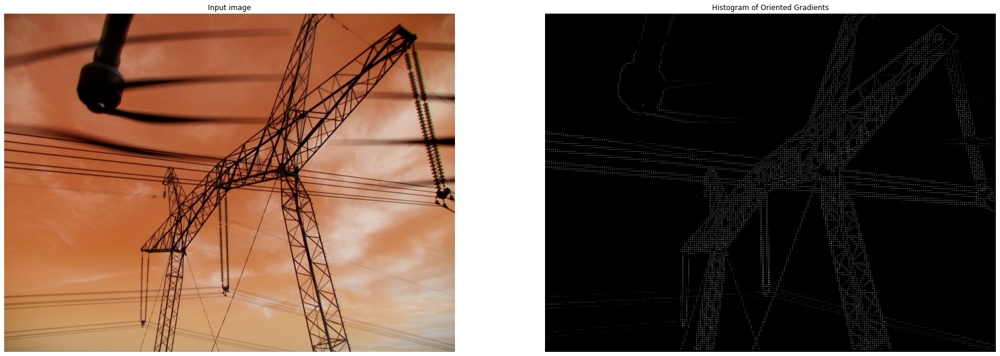

In [29]:
histogram(cv_rgb_img[2], 10, 15, 40)